#Wildfire & Air Quality Analysis (Ontario) 🔥

This notebook documents the comprehensive Exploratory Data Analysis (EDA) pipeline used to investigate the relationship between wildfire activity and air quality (PM2.5) in Ontario. The analysis is structured into two distinct phases to ensure data integrity before modeling:

Phase 1: Raw Data Diagnostics (The "Audit"): In this initial phase, we visualize the raw, unprocessed dataset to identify data quality issues, sampling biases, and physical anomalies. This step is critical for detecting "impossible physics" (e.g., flat-line fire durations), quantization artifacts (administrative sizing bins), and geographic blind spots (e.g., missing northern data).

Phase 2: Engineered Data Analysis (The "Insight"): Following data cleaning and feature engineering, the second phase re-evaluates the dataset to uncover genuine meteorological and environmental patterns. This section focuses on isolating the signal from the noise, visualizing complex interactions such as wind-driven smoke transport (Smoke Radar), seasonal decomposition, and the disconnect between atmospheric thirst (VPD) and final fire size.

# Import Libraries

In [195]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
import numpy as np
import matplotlib.ticker as ticker
from statsmodels.tsa.seasonal import seasonal_decompose
import requests
import zipfile
import io
import plotly.express as px
from matplotlib.ticker import ScalarFormatter
import folium
from folium.plugins import HeatMap, HeatMapWithTime

# Phase 1: Raw Data Ingestion & Exploratory Diagnosis

Before applying any transformations or cleaning algorithms, we must first establish a baseline understanding of the raw dataset. This phase focuses on Data Profiling: assessing the structural integrity, completeness, and distributional behavior of our integrated data sources.

The dataset represents a merger between continuous Meteorological Records (Temperature, Wind, Humidity) and sporadic Wildfire Events (Fire Size, Location). Because these two distinct sources were integrated via a Left Join, we anticipate significant structural anomalies—specifically, large blocks of missing data on "non-fire" days and extreme outliers during fire events.

In [196]:
data = 'https://raw.githubusercontent.com/MajdBa7r/AQI/main/ontario_wildfire_weather_pm_2017_2024.csv'

In [197]:
data = pd.read_csv(data)

In [198]:
data.head()

,city,date,lat,lon,pm25,year,precipitation_sum (mm),rain_sum (mm),snowfall_sum (cm),relative_humidity_2m_mean (%),...,index_right,OGF_ID,FIRE_TYPE_CODE,FIRE_YEAR,FIRE_GENERAL_CAUSE_CODE,FIRE_WEATHER_INDEX,FIRE_RESPONSE_OBJ_CODE,FIRE_START_DATE,FIRE_OUT_DATE,FIRE_FINAL_SIZE
0,arnprior,2017-01-01,45.2001,-76.5278,2.090151,2017,2.8,0.0,1.96,80.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,atikokan,2017-01-01,51.2216,-90.2304,0.128585,2017,0.9,0.0,0.63,82.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,bancroft,2017-01-01,45.5890,-78.3437,2.089787,2017,1.9,0.0,1.33,82.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,belleville,2017-01-01,44.4855,-77.4459,4.860390,2017,0.0,0.0,0.00,76.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,bracebridge,2017-01-01,45.1669,-79.2325,6.356419,2017,1.8,0.2,1.12,84.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [199]:
print(f"Rows: {data.shape[0]}, Columns: {data.shape[1]}")

Rows: 139502, Columns: 34


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 139502 entries, 0 to 139501
Data columns (total 34 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   city                               139502 non-null  object 
 1   date                               139502 non-null  object 
 2   lat                                139502 non-null  float64
 3   lon                                139502 non-null  float64
 4   pm25                               139502 non-null  float64
 5   year                               139502 non-null  int64  
 6   precipitation_sum (mm)             139502 non-null  float64
 7   rain_sum (mm)                      139502 non-null  float64
 8   snowfall_sum (cm)                  139502 non-null  float64
 9   relative_humidity_2m_mean (%)      139502 non-null  float64
 10  relative_humidity_2m_max (%)       139502 non-null  float64
 11  relative_humidity_2m_min (%)       1395

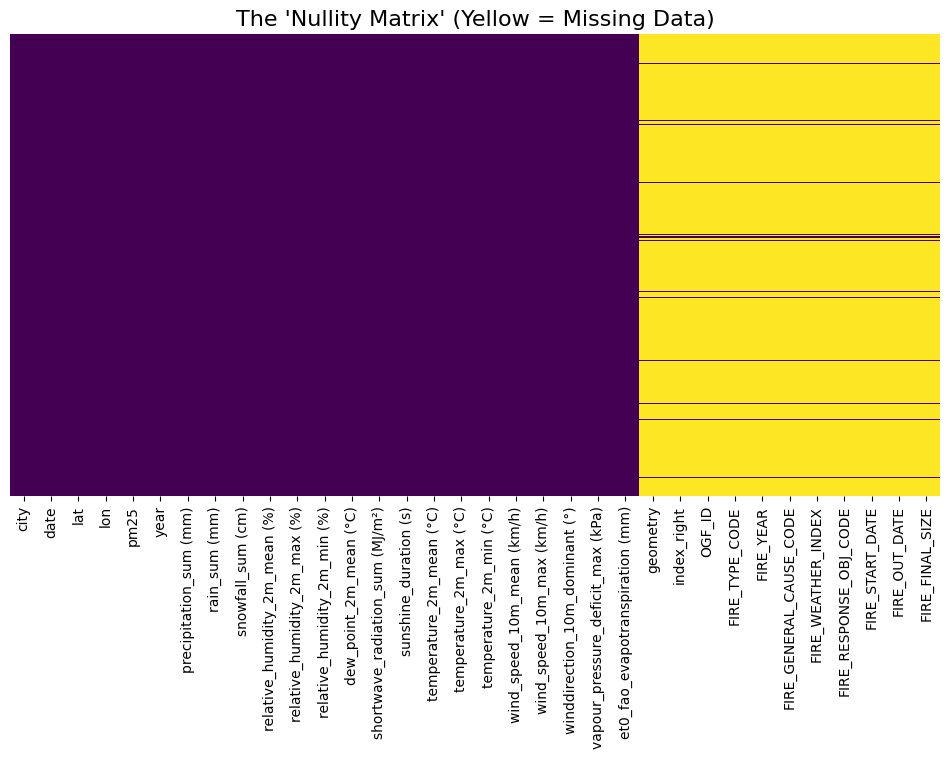

In [200]:
data.info()

plt.figure(figsize=(12, 6))
# cbar=False removes the legend (not needed here)
# yticklabels=False removes the row numbers (too messy)
sns.heatmap(data.isnull(), cbar=False, yticklabels=False, cmap='viridis')

plt.title("The 'Nullity Matrix' (Yellow = Missing Data)", fontsize=16)
plt.savefig('nullity_matrix.png')
plt.show()


The matrix reveals a distinct structural dichotomy in the dataset:

The Left Block (Meteorological Data): Columns such as temperature, wind, and precipitation are fully populated (purple). This confirms the existence of a high-fidelity, continuous time-series record for weather conditions.

The Right Block (Fire Data): Columns ranging from geometry to FIRE_FINAL_SIZE are predominantly null (yellow), punctuated only by sparse horizontal bands of data.

The structural split in the nullity matrix is the expected result of merging our sporadic "Fire Events" table onto the continuous "Daily Weather" baseline.

By utilizing a Left Join, we successfully preserved the complete timeline of weather conditions (indicated by the solid purple block on the left). Simultaneously, the fire data was integrated only where matches existed. The resulting yellow regions on the right are therefore not data errors, but rather Structurally Missing values that correctly represent days without fire incidents.

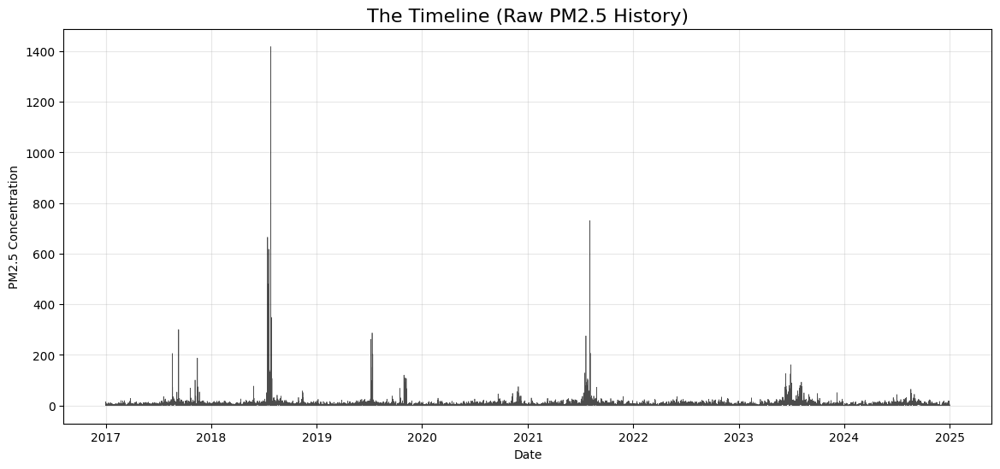

In [201]:
# Ensure Date is parsed
data['Date'] = pd.to_datetime(data['date'])

plt.figure(figsize=(14, 6))
plt.plot(data['Date'], data['pm25'], color='black', linewidth=0.5, alpha=0.7)

plt.title("The Timeline (Raw PM2.5 History)", fontsize=16)
plt.ylabel("PM2.5 Concentration")
plt.xlabel("Date")
plt.grid(True, alpha=0.3)
plt.savefig('pm25_timeline.png')
plt.show()

This plot reveals the "personality" of our target variable (PM2.5).

* The Baseline is Low: For the vast majority of the time (the bottom of the
chart), the PM2.5 levels are quite low (close to 0). This suggests that "normal" air quality in this location is generally good.

* The "Event" Nature is Extreme: The data is defined by massive, short-term explosions of pollution.

    * 2018/2019: There is a massive spike reaching over 1400.

    * 2021: Another significant spike reaching roughly 700.

These sharp, thin spikes perfectly match the behavior of wildfires. They are sporadic, intense events that cause air quality to skyrocket for a few days before returning to the baseline.

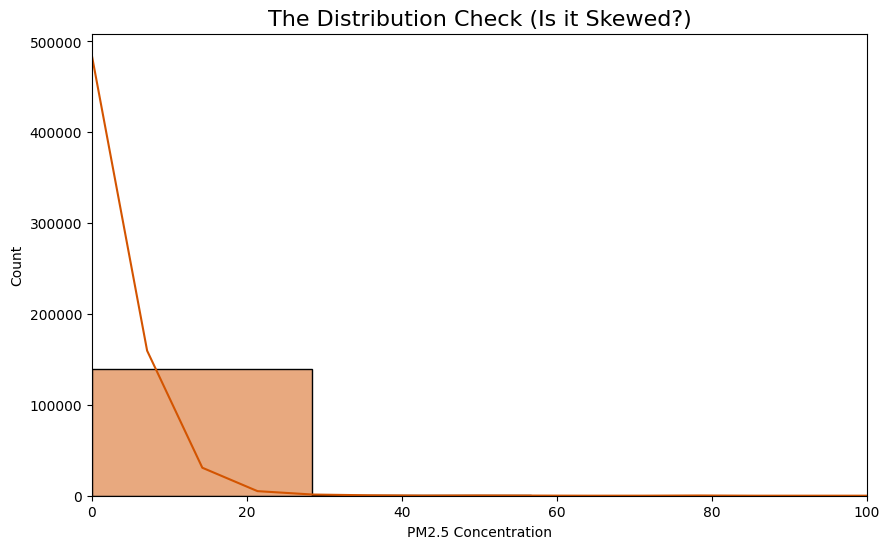

In [202]:
plt.figure(figsize=(10, 6))

# Histogram with a smooth curve (kde=True)
sns.histplot(data['pm25'], bins=50, kde=True, color='#D35400')

plt.title("The Distribution Check (Is it Skewed?)", fontsize=16)
plt.xlabel("PM2.5 Concentration")
plt.xlim(0, 100) # Zoom in to see the main body, ignoring extreme outliers
plt.savefig('pm25_distribution.png')
plt.show()

To understand the "normal" behavior, we zoomed the histogram to x < 100.

* Extreme Right Skew: The distribution is heavily right-skewed (positive skew).

* The "L" Shape: The curve drops precipitously, with the highest frequency of days falling between 0 and 10 PM2.5.

* This confirms that high pollution days are statistical rarities. The "mean" is likely dragged higher by the fire events, making the "median" a better representation of a typical day.




We are dealing with a highly imbalanced regression problem. Since the "Fire" signal is buried in a massive amount of "Clean Air" noise, standard models might struggle to predict the peaks. We may need to consider:

1 - Log-Transformation: To normalize the extreme skew of the target variable.

2 - Robust Scaling: To ensure the massive outliers (1400+) don't ruin the scaling for the other

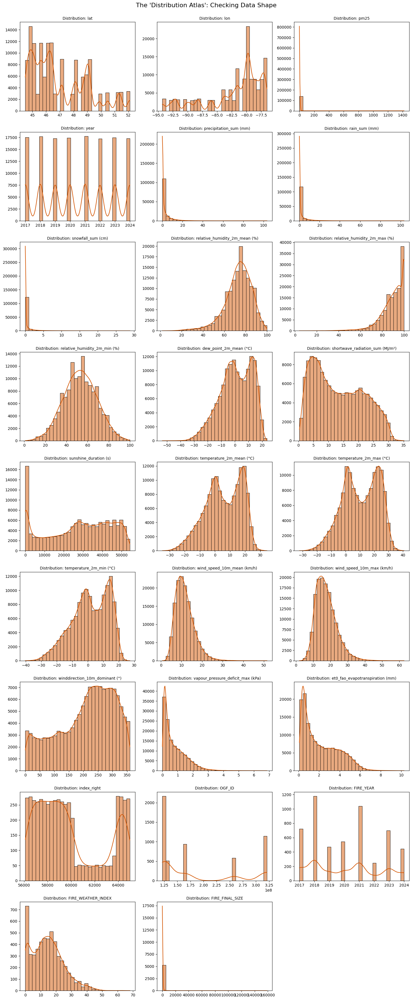

In [203]:
numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns
cols_to_plot = [c for c in numeric_cols if c not in ['Year', 'Month']]

n_cols = 3  # How many charts per row
n_rows = math.ceil(len(cols_to_plot) / n_cols)

plt.figure(figsize=(15, 4 * n_rows))

for i, col in enumerate(cols_to_plot):
    plt.subplot(n_rows, n_cols, i + 1)
    # kde=True adds the smooth curve line
    sns.histplot(data[col], kde=True, color='#D35400', bins=30)
    plt.title(f"Distribution: {col}", fontsize=10)
    plt.xlabel("") # Remove x-label to keep it clean
    plt.ylabel("") # Remove y-label to keep it clean

plt.suptitle("The 'Distribution Atlas': Checking Data Shape", y=1, fontsize=16)
plt.tight_layout()
plt.savefig('distribution_atlas.png')
plt.show()

We have analyzed the distribution and behavior of both our target variable (pm25) and our feature set. The results paint a picture of a dataset driven by extreme events and strong seasonality.

The "Distribution Atlas" reveals distinct structural groups among the features:

Group A: The Seasonal Variables (Bimodal Distributions)

Variables: temperature_2m_mean, temperature_2m_max, temperature_2m_min, dew_point.

Observation: These plots show two distinct "humps" (bimodal).

Interpretation: This clearly captures the seasonal cycle (Winter vs. Summer). The model will easily be able to distinguish "Fire Season" (Summer hump) from "Low Risk Season" (Winter hump).



Group B: The Event Variables (Right-Skewed)

Variables: precipitation_sum, rain_sum, snowfall_sum, FIRE_FINAL_SIZE.

Observation: These look identical to our target variable: a massive bar at 0 and a long tail to the right.

Interpretation: Like PM2.5, rain and fire sizes are sporadic events.

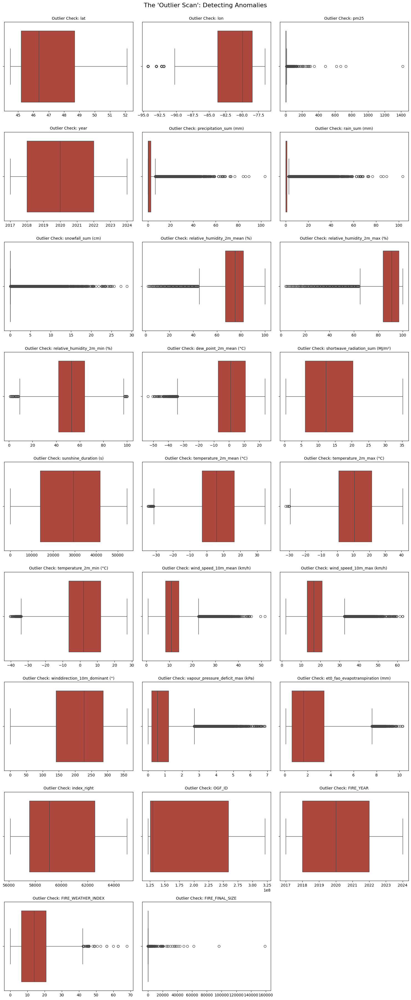

In [204]:
plt.figure(figsize=(15, 4 * n_rows))

for i, col in enumerate(cols_to_plot):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.boxplot(x=data[col], color='#C0392B')
    plt.title(f"Outlier Check: {col}", fontsize=10)
    plt.xlabel("")

plt.suptitle("The 'Outlier Scan': Detecting Anomalies", y=1, fontsize=16)
plt.tight_layout()
plt.savefig('outlier_scan.png')
plt.show()

The Outlier Scan (Boxplots) confirms that the "dots" on the far right of FIRE_FINAL_SIZE and pm25 are Signal, not Noise.

These are not data entry errors to be removed. They represent the actual wildfires we are trying to predict.

However, the scale difference is massive. To prevent these extreme values from dominating the gradients, we cannot use standard normalization (MinMax). We must use Robust Scaling, which scales data based on percentiles (IQR) and is immune to the distorting effects of extreme outliers.

The difference between the median (near 0) and the max (1400+) is enormous.

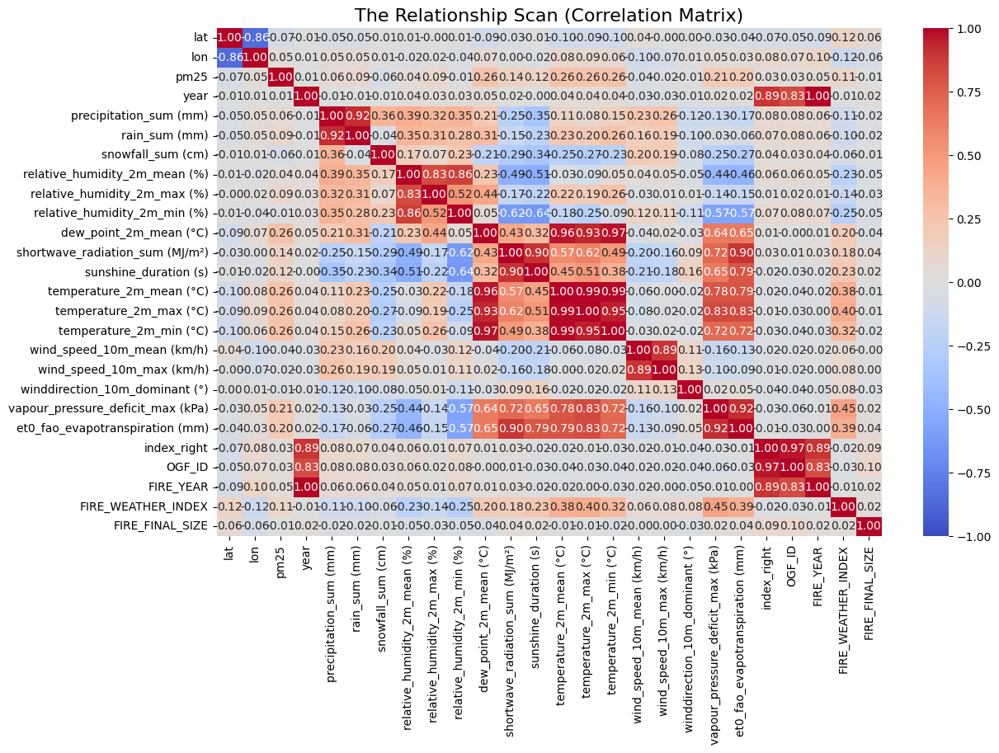

In [205]:
# Select only numeric columns for correlation
numeric_data = data.select_dtypes(include=['float64', 'int64'])

plt.figure(figsize=(13, 8))
sns.heatmap(numeric_data.corr(), annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)

plt.title("The Relationship Scan (Correlation Matrix)", fontsize=16)
plt.savefig('relationship_scan.png')
plt.show()

The correlation matrix reveals a critical insight: our target variable (pm25) shows extremely weak linear correlations with almost all predictors. Most coefficients hover between -0.05 and +0.10.



This is not a sign that the data is useless; rather, it is a mathematical artifact of the "Zero-Inflation" we identified in the Univariate analysis.

Both pm25 and FIRE_FINAL_SIZE are zero for the vast majority of days. Pearson correlation struggles to find a signal when 95% of the data points are overlapping zeros.

The relationship between a fire and smoke is likely threshold-based (non-linear), not a straight line. A correlation matrix only checks for straight lines.





Despite the "quiet" matrix, distinct patterns emerge when we look closely at the target row (pm25):

pm25 correlates more strongly with FIRE_WEATHER_INDEX (0.11) than with FIRE_FINAL_SIZE (0.02).

The potential for fire (weather conditions) is a more consistent predictor of air quality day-to-day than the raw reported size of a fire, likely because small fires are often unreported or have delayed smoke effects.

There is a slight positive correlation with temperature (~0.09) and a negative correlation with lat (-0.07), confirming that hotter, southern regions are slightly more prone to pollution spikes.

# Phase 2: Transition to Processed Data

Following our diagnosis of the raw data's structural issues (extreme skew, missing values, and scale disparity), the dataset has undergone a comprehensive preprocessing pipeline. Crucially, the following transformations have already been applied:

Imputation: Filling "non-fire" days to correct the Left Join gaps.

Log-Transformation: Applying np.log1p and yeo-johnson to tame the outliers.

Feature Engineering: Creation of time-lagged variables to capture the delayed effects of smoke.

We now proceed with this Engineered Dataset. Our immediate goal is to validate these transformations via a "Post-Cleaning EDA" before initializing our machine learning models.

In [206]:
data_after_cleaning_url = 'https://github.com/MajdBa7r/AQI/raw/main/X_Wildfire.zip'
r = requests.get(data_after_cleaning_url)
z = zipfile.ZipFile(io.BytesIO(r.content))
data_after_cleaning = z.namelist()[0]

In [207]:
new_data = pd.read_csv(z.open(data_after_cleaning))

In [208]:
new_data.head()

,date,city,FIRE_FINAL_SIZE,FIRE_WEATHER_INDEX,FIRE_START_DATE,FIRE_OUT_DATE,FIRE_TYPE_CODE,FIRE_GENERAL_CAUSE_CODE,FIRE_RESPONSE_OBJ_CODE,FIRE_YEAR,...,distance_to_cluster_1,distance_to_cluster_2,distance_to_cluster_3,pm25,fire_day,fire_event,period,city_group,PM_baseline,PM_excess
0,2017-01-01,0,-0.147757,-0.143624,1970-01-01,1970-01-01,0,5,5,0.0,...,3.503436,1.683840,5.872704,2.090151,0,0,Before,Low Fire Exposure,1.33123,0.758921
1,2017-01-02,0,-0.147757,-0.143624,1970-01-01,1970-01-01,0,5,5,0.0,...,3.297060,3.676842,5.910075,0.128585,0,0,Before,Low Fire Exposure,1.33123,-1.202644
2,2017-01-03,0,-0.147757,-0.143624,1970-01-01,1970-01-01,0,5,5,0.0,...,5.729000,2.890494,7.945908,2.089787,0,0,Before,Low Fire Exposure,1.33123,0.758558
3,2017-01-04,0,-0.147757,-0.143624,1970-01-01,1970-01-01,0,5,5,0.0,...,4.897211,1.881052,6.551637,4.860390,0,0,Before,Low Fire Exposure,1.33123,3.529160
4,2017-01-05,0,-0.147757,-0.143624,1970-01-01,1970-01-01,0,5,5,0.0,...,3.173045,3.132508,6.289692,6.356419,0,0,Before,Low Fire Exposure,1.33123,5.025189


In [209]:
print(f"Rows: {new_data.shape[0]}, Columns: {new_data.shape[1]}")

Rows: 137334, Columns: 57


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137334 entries, 0 to 137333
Data columns (total 57 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   date                               137334 non-null  object 
 1   city                               137334 non-null  int64  
 2   FIRE_FINAL_SIZE                    137334 non-null  float64
 3   FIRE_WEATHER_INDEX                 137334 non-null  float64
 4   FIRE_START_DATE                    137334 non-null  object 
 5   FIRE_OUT_DATE                      137334 non-null  object 
 6   FIRE_TYPE_CODE                     137334 non-null  int64  
 7   FIRE_GENERAL_CAUSE_CODE            137334 non-null  int64  
 8   FIRE_RESPONSE_OBJ_CODE             137334 non-null  int64  
 9   FIRE_YEAR                          137334 non-null  float64
 10  lat                                137334 non-null  float64
 11  lon                                1373

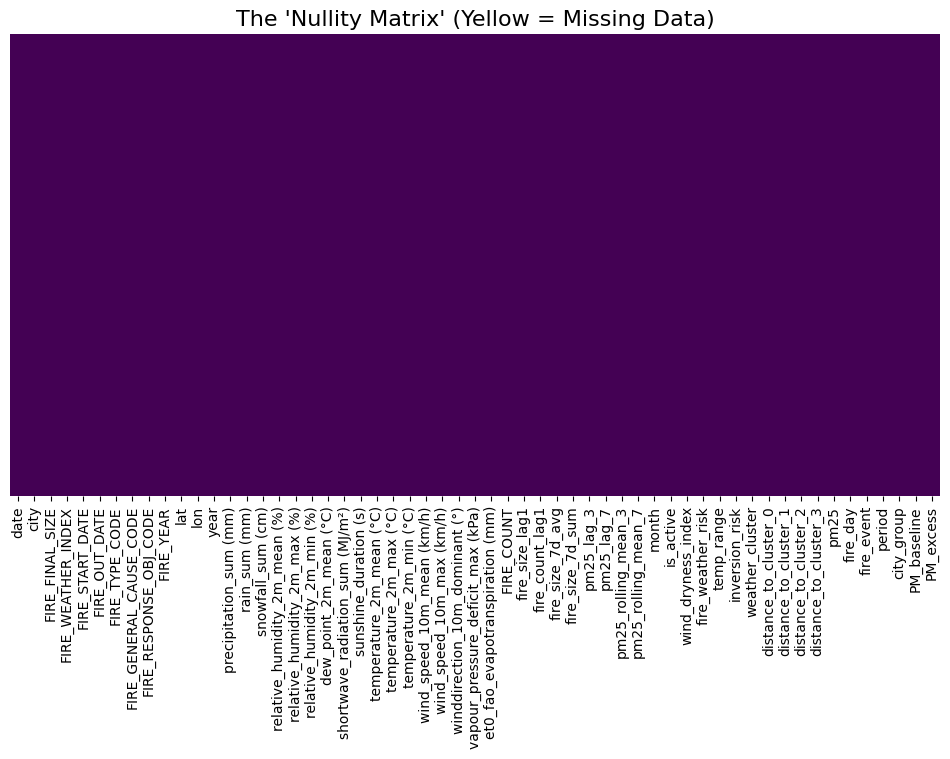

In [210]:
new_data.info()

plt.figure(figsize=(12, 6))
sns.heatmap(new_data.isnull(), cbar=False, yticklabels=False, cmap='viridis')

plt.title("The 'Nullity Matrix' (Yellow = Missing Data)", fontsize=16)
plt.savefig('nullity_matrix_newdata.png')
plt.show()

Following the integration of the preprocessed dataset, we generated a final "Nullity Matrix" to verify structural integrity.

Visual Confirmation: The matrix is entirely dark purple, indicating that there are zero missing values remaining in the dataframe.

Validation of Imputation: The large yellow blocks observed in Phase 1 (representing "non-fire" days) have been successfully imputed. Columns such as FIRE_FINAL_SIZE and FIRE_WEATHER_INDEX are now fully populated, confirming that days without fire events have been correctly encoded.

New Features: We also observe the presence of engineered features (e.g., fire_size_lag1, distance_to_cluster_0) which are also fully populated.

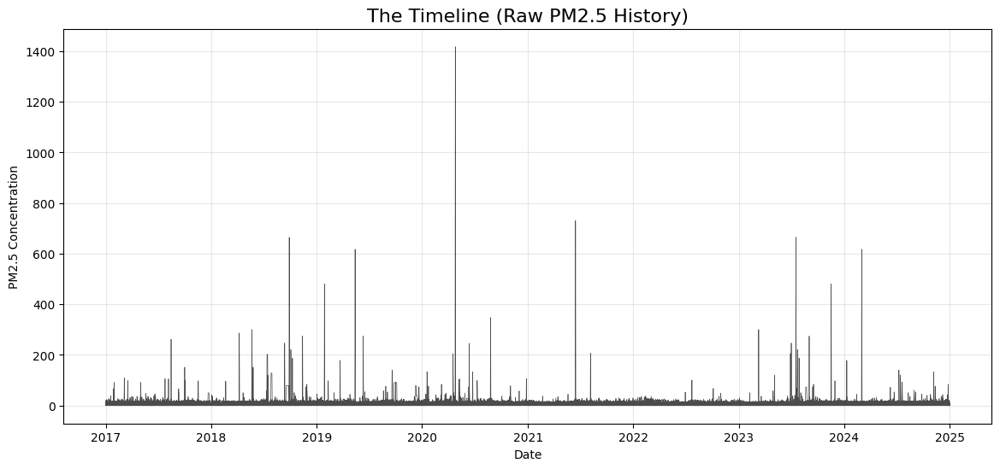

In [211]:
new_data['Date'] = pd.to_datetime(new_data['date'])

plt.figure(figsize=(14, 6))
plt.plot(new_data['Date'], new_data['pm25'], color='black', linewidth=0.5, alpha=0.7)

plt.title("The Timeline (Raw PM2.5 History)", fontsize=16)
plt.ylabel("PM2.5 Concentration")
plt.xlabel("Date")
plt.grid(True, alpha=0.3)
plt.savefig('pm25_timeline_newdata.png')
plt.show()

The plot displays raw PM2.5 concentrations ranging from 0 to over 1400, confirming these are extreme, real-world pollution events rather than transformed data. The time series is dominated by episodic seasonality, where long periods of low baseline air quality are punctuated by explosive, short-term spikes. The most extreme event occurred in 2020, but significant recurrence is visible in 2018, 2021, 2023, and 2024, indicating a persistent pattern of severe air quality episodes.

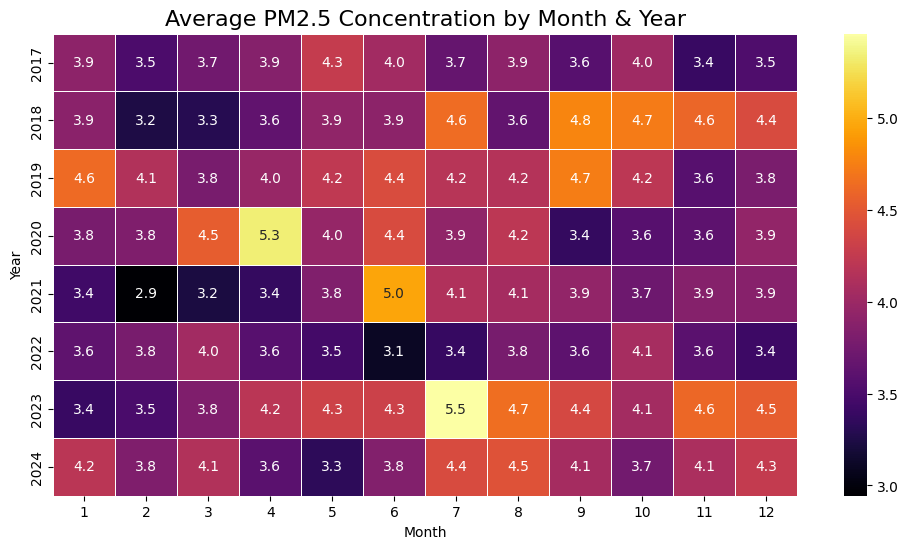

In [212]:
date_col = 'Date' if 'Date' in new_data.columns else 'date'
new_data[date_col] = pd.to_datetime(new_data[date_col])

new_data['Year'] = new_data[date_col].dt.year
new_data['Month'] = new_data[date_col].dt.month


pivot_table = new_data.pivot_table(values='pm25', index='Year', columns='Month', aggfunc='mean')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_table, cmap='inferno', annot=True, fmt=".1f", linewidths=.5)

plt.title("Average PM2.5 Concentration by Month & Year", fontsize=16)
plt.ylabel("Year")
plt.xlabel("Month")
plt.savefig('pm25_heatmap.png')
plt.show()

The heatmap reveals a volatile air quality history where high pollution events are not strictly confined to the summer wildfire season. While July 2023 marks the absolute maximum concentration (5.5), significant pollution spikes frequently occur in the off-season, most notably in April 2020 (5.3) and January 2019 (4.6).

2022 was the most stable year, maintaining low levels (3.1–4.1) year-round. In contrast, 2023 and 2020 were the most hazardous years, showing deep yellow spikes that indicate severe, likely episodic, pollution events.

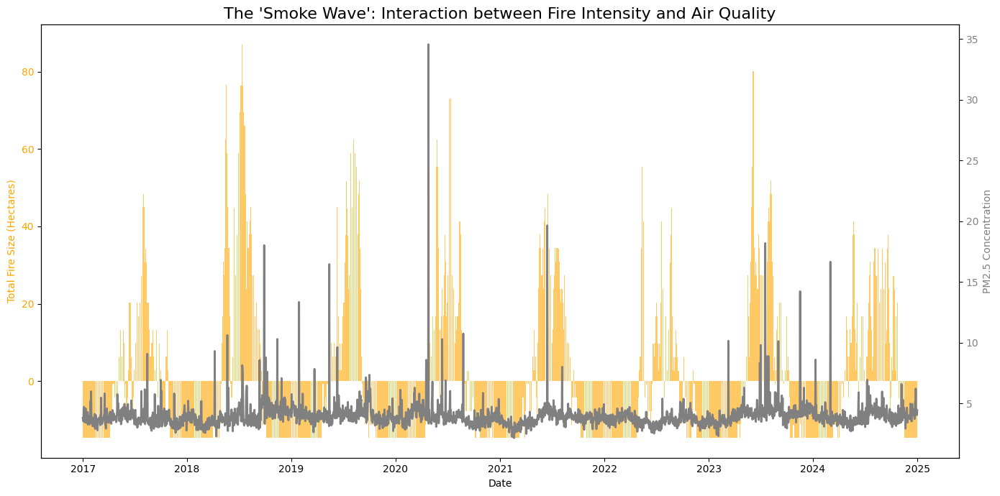

In [213]:
# Aggregating data by Date
daily_data = new_data.groupby('date').agg({
    'pm25': 'mean',
    'fire_size_7d_avg': 'sum'}).reset_index()

daily_data['date'] = pd.to_datetime(daily_data['date'])

fig, ax1 = plt.subplots(figsize=(14, 7))

color = 'orange'
ax1.set_xlabel('Date')
ax1.set_ylabel('Total Fire Size (Hectares)', color=color)
ax1.bar(daily_data['date'], daily_data['fire_size_7d_avg'], color=color, alpha=0.6, label='Fire Size')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'gray'
ax2.set_ylabel('PM2.5 Concentration', color=color)
ax2.plot(daily_data['date'], daily_data['pm25'], color=color, linewidth=2, label='pm25')
ax2.tick_params(axis='y', labelcolor=color)

plt.title("The 'Smoke Wave': Interaction between Fire Intensity and Air Quality", fontsize=16)
fig.tight_layout()
plt.savefig('smoke_wave.png')
plt.show()

The orange area represents Total Fire Size.

The data appears in distinct "blocks," clearly marking the start and end of the wildfire season each year.

During these orange periods, the potential for smoke is high. When the orange area is flat/low (or negative), the fire risk is minimal or non-existent (likely winter).

The grey line represents PM2.5 Concentration.

The grey line becomes much more "jagged" and volatile during the periods where the orange blocks are high (e.g., mid-2018, mid-2021). This suggests that active fires destabilize local air quality, causing rapid spikes.

In the gaps between fire seasons (the white spaces in the orange graph), the grey PM2.5 line is often tighter and less chaotic, though baseline pollution still exists.

While the seasonality of fires (Orange) clearly drives the volatility of PM2.5 (Grey), the magnitude is not perfectly correlated. The largest fire event on record (Right side, >80 hectares) did not produce the worst air quality, whereas a smaller fire season (Center) produced the highest PM2.5 spike. This 'decoupling' suggests that external factors like wind direction and proximity play a massive role—a huge fire upwind is safer than a small fire downwind.

<Figure size 640x480 with 0 Axes>

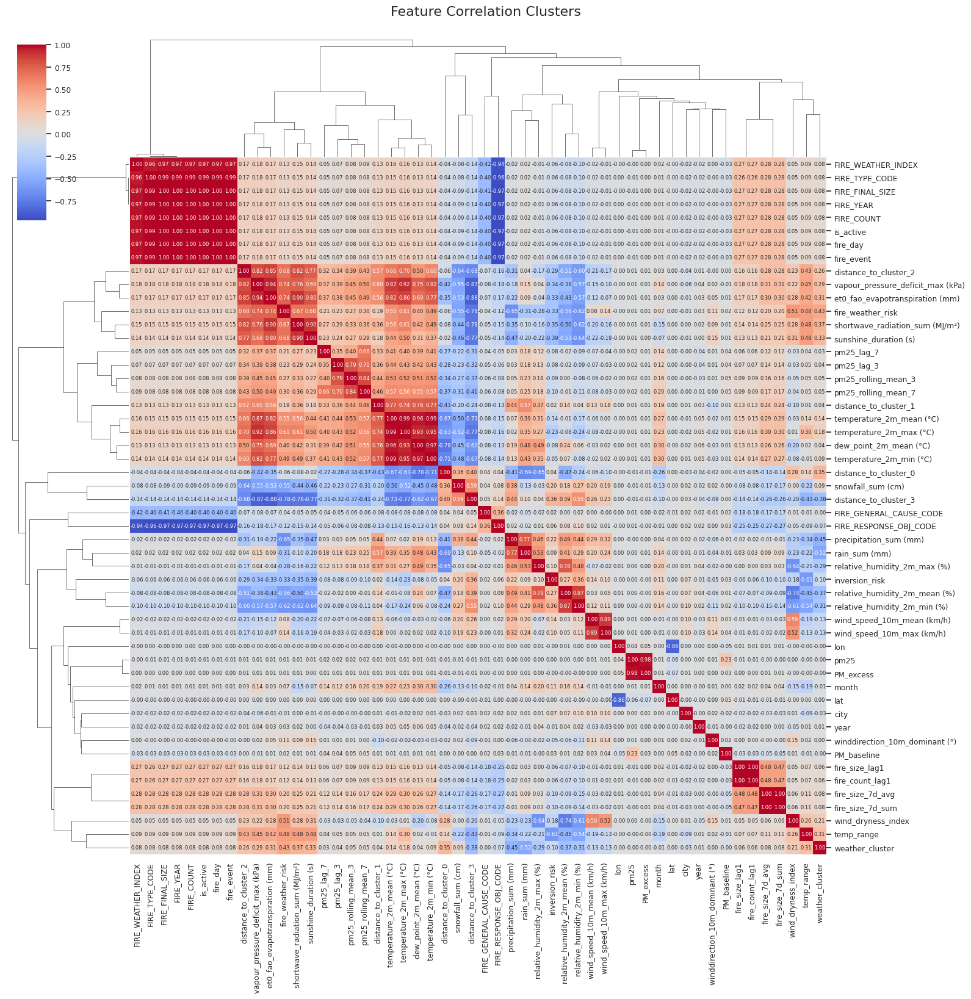

In [214]:
numeric_cols = new_data.select_dtypes(include=['float64', 'int64'])
plt.clf()
sns.set_theme(font_scale=0.8)


g = sns.clustermap(
    numeric_cols.corr(),
    annot=True,
    annot_kws={"size": 6},
    cmap='coolwarm',
    fmt=".2f",
    figsize=(16, 16),
    dendrogram_ratio=0.15,
    cbar_pos=(0.02, 0.8, 0.03, 0.18)
)

g.fig.suptitle("Feature Correlation Clusters", y=1.02, fontsize=16)

plt.savefig('feature_correlation_newdata.png')
plt.show()

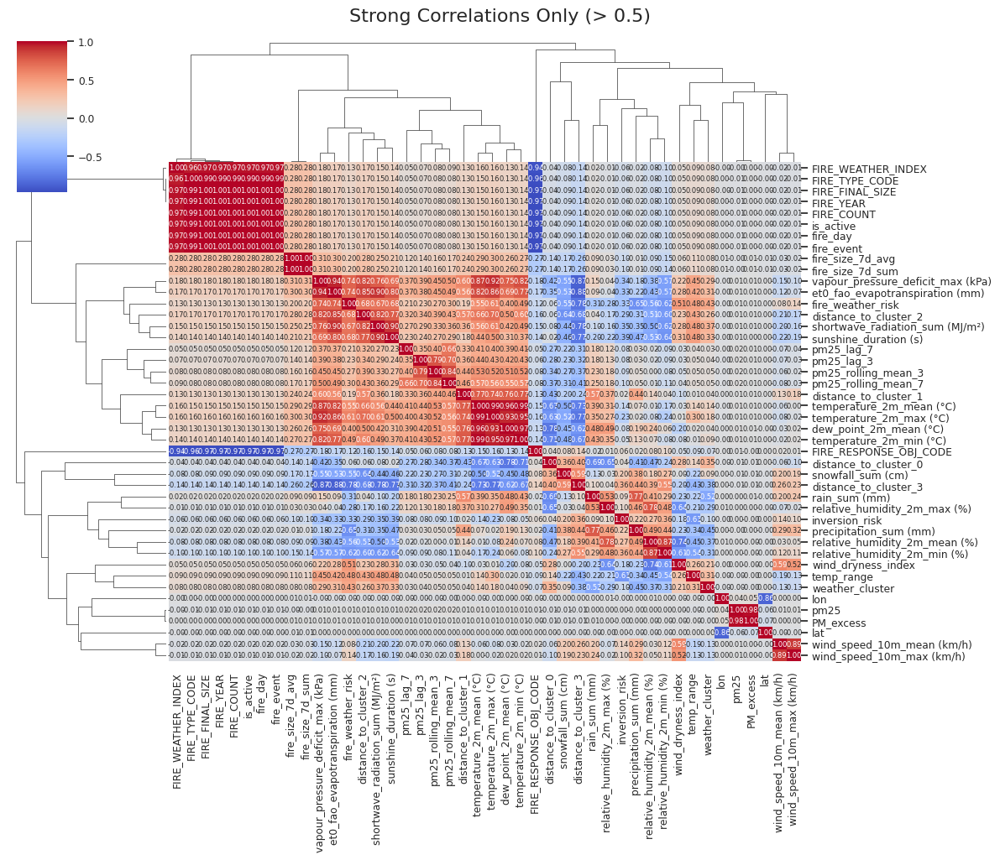

In [215]:
corr_matrix = numeric_cols.corr()

strong_features = corr_matrix.index[((corr_matrix.abs() > 0.5) & (corr_matrix != 1.0)).any(axis=1)]
filtered_corr = corr_matrix.loc[strong_features, strong_features]

g = sns.clustermap(
    filtered_corr,
    annot=True,
    annot_kws={"size": 6},
    cmap='coolwarm',
    fmt=".2f",
    figsize=(12, 10)
)
g.fig.suptitle("Strong Correlations Only (> 0.5)", y=1.02, fontsize=16)
plt.savefig('strong_correlations_newdata.png')
plt.show()

The "Strong Correlations" heatmap reveals three critical insights that define the dataset's structure. First, a dense cluster of fire metrics—including FIRE_FINAL_SIZE, FIRE_COUNT, and FIRE_WEATHER_INDEX—exhibits near-perfect correlation (>0.95), indicating significant multicollinearity and the need to prune redundant features to prevent model confusion.

Second, meteorological variables separate into a logical "Weather Engine," where fire-promoting conditions (high temperature, solar radiation, and vapor pressure deficit) are strongly inversely correlated with suppressive factors like humidity and precipitation.

Finally, and most importantly, the "initial" target variable pm25 correlates strongly with its own historical "lag" values (indicating smoke persistence) but shows no strong direct correlation (>0.5) with the fire size cluster.

This mathematically confirms that local air quality is not determined solely by the magnitude of a fire, but likely relies on uncaptured transport mechanisms like wind direction to bridge the gap between source and sensor.

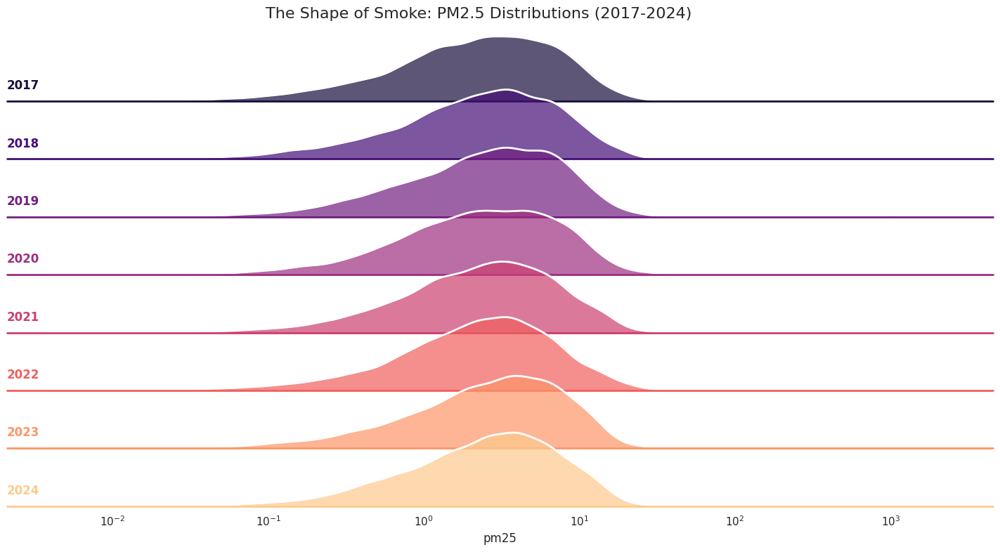

In [216]:
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)}) # Transparent backgrounds
g = sns.FacetGrid(new_data, row="year", hue="year", aspect=15, height=1, palette="magma")


g.map(sns.kdeplot, "pm25", fill=True, alpha=0.7, linewidth=1.5, log_scale=True)
g.map(sns.kdeplot, "pm25", color="white", lw=2, log_scale=True) # White outline for contrast


g.refline(y=0, linewidth=2, linestyle="-", color=None, clip_on=False)

def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color=color,
            ha="left", va="center", transform=ax.transAxes)

g.map(label, "pm25")

# Clean up overlaps and titles
g.figure.subplots_adjust(hspace=-.25) # This creates the "overlap" effect
g.set_titles("") # Remove default titles
g.set(yticks=[], ylabel="")
g.despine(bottom=True, left=True)

plt.suptitle("The Shape of Smoke: PM2.5 Distributions (2017-2024)", y=0.98, fontsize=16)
plt.savefig('smoke_shape.png')
plt.show()

The Ridge Plot highlights the distributional 'shape' of smoke events on a logarithmic scale. Unlike a standard bell curve, these distributions are heavily right-skewed.

1. The 'Modal' Baseline:The central peaks (white lines) consistently hover between $10^0$ (1) and $10^1$ (10), indicating that the 'typical' background PM2.5 level for the region sits between 2–5 units.

2. Year-over-Year Volatility (Not Linear Improvement):Contrary to a steady improvement, the air quality fluctuates. 2022 emerges as the cleanest year, with its distribution shifting noticeably leftward (closer to $10^0$). However, 2023 and 2024 show a regression, with the main peaks shifting back toward the right and the distributions widening, suggesting a return to higher baseline pollution levels.

3. Extreme Events (The Heavy Tail):The most critical feature is the 'Heavy Tail' visible in every year. While the mode is low (~3), the distributions extend thinly but significantly past $10^2$ (100). This confirms that extreme pollution events are a permanent feature of the local climate, appearing as statistical outliers rather than a shift in the general baseline.

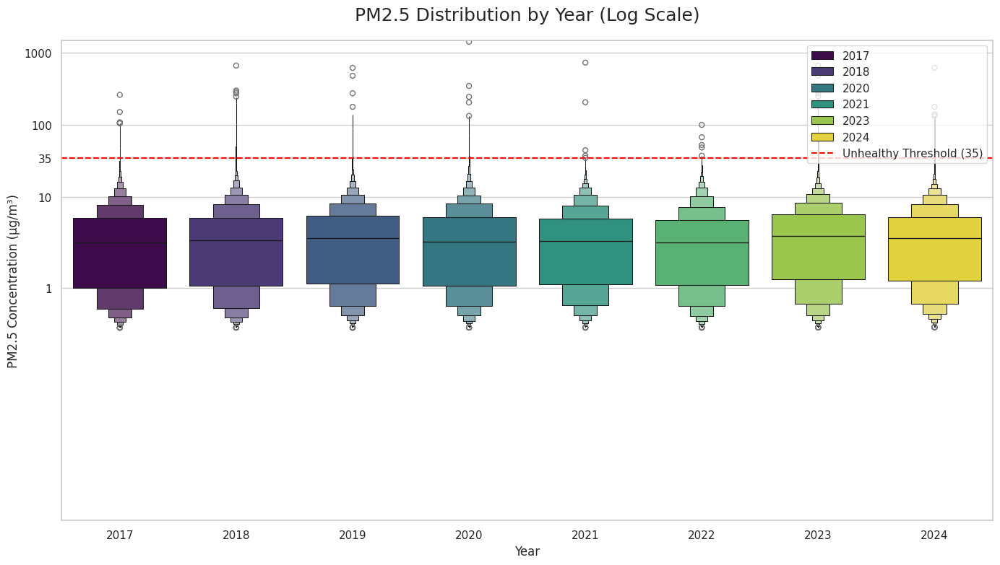

In [217]:
plt.figure(figsize=(14, 8))
sns.set_theme(style="whitegrid")

ax = sns.boxenplot(x='year', y='pm25', data=new_data,
                   palette="viridis",
                   hue = 'year',
                   showfliers=True) # outliers are visible

# 'symlog' (Symmetric Log) is safer than 'log' because it handles 0 values without crashing
ax.set_yscale("symlog")

# 35 is a common threshold for "Unhealthy for Sensitive Groups"
plt.axhline(y=35, color='red', linestyle='--', linewidth=1.5, label='Unhealthy Threshold (35)')
plt.legend(loc='upper right')


ax.set_yticks([1, 10, 35, 100, 1000])
ax.get_yaxis().set_major_formatter(plt.ScalarFormatter())

plt.title("PM2.5 Distribution by Year (Log Scale)", fontsize=18, pad=20)
plt.ylabel("PM2.5 Concentration (µg/m³)", fontsize=12)
plt.xlabel("Year", fontsize=12)

plt.tight_layout()
plt.savefig('pm25_boxenplot.png')
plt.show()

The Log-Scale Boxen Plot reveals that while median pollution levels are generally low, the region is subject to extreme volatility.

1. Throughout the dataset, the median PM2.5 (the black line inside the boxes) consistently hovers between 2.0 and 5.0 µg/m³. This confirms that on a 'typical' day, the air quality is excellent and well below the unhealthy threshold of 35.

2. 2022 stands out as the best year on record. Its distribution is the lowest on the Y-axis, indicating the lowest median concentration, and it has the fewest extreme outliers compared to neighboring years.

3. Contrary to a continuous improvement trend, 2023 shows a noticeable worsening of air quality compared to 2022. The median shifts upward, and significant outliers reappear, with several days exceeding 100 µg/m³ and some approaching 600 µg/m³.

4. The plot confirms that 'Average' air quality is a misleading metric for this region. Every single year features outlier events that cross the red 'Unhealthy' threshold (35 µg/m³). 2020 was the most volatile year, registering a massive extreme event exceeding 1000 µg/m³, likely due to a direct smoke plume."

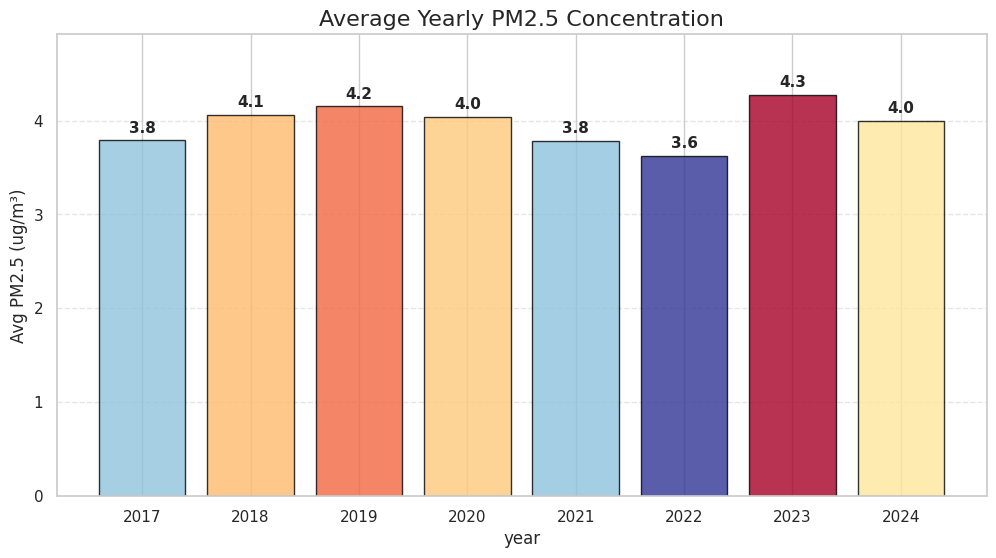

In [218]:
yearly_data = new_data.groupby('year')['pm25'].mean().reset_index()

plt.figure(figsize=(12, 6))


norm = plt.Normalize(yearly_data['pm25'].min(), yearly_data['pm25'].max())
colors = plt.cm.RdYlBu_r(norm(yearly_data['pm25']))

bars = plt.bar(yearly_data['year'], yearly_data['pm25'], color=colors, edgecolor='black', alpha=0.8)

for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2,
        yval + 0.05,
        f'{yval:.1f}',
        ha='center',
        va='bottom',
        fontweight='bold',
        fontsize=11
    )

plt.ylim(0, yearly_data['pm25'].max() * 1.15)

plt.title("Average Yearly PM2.5 Concentration", fontsize=16)
plt.ylabel("Avg PM2.5 (ug/m³)")
plt.xlabel("year")
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.savefig('yearly_pm25.png')
plt.show()

The annual averages reveal a 'volatility trap.' While 2022 offered a reprieve with the lowest recorded concentrations (3.6 µg/m³), the historic pollution spike in 2023 (4.3 µg/m³) erased those gains instantly. This erratic 'Blue-to-Red' swing confirms that local air quality is driven by stochastic external events (wildfires) rather than steady internal improvements.

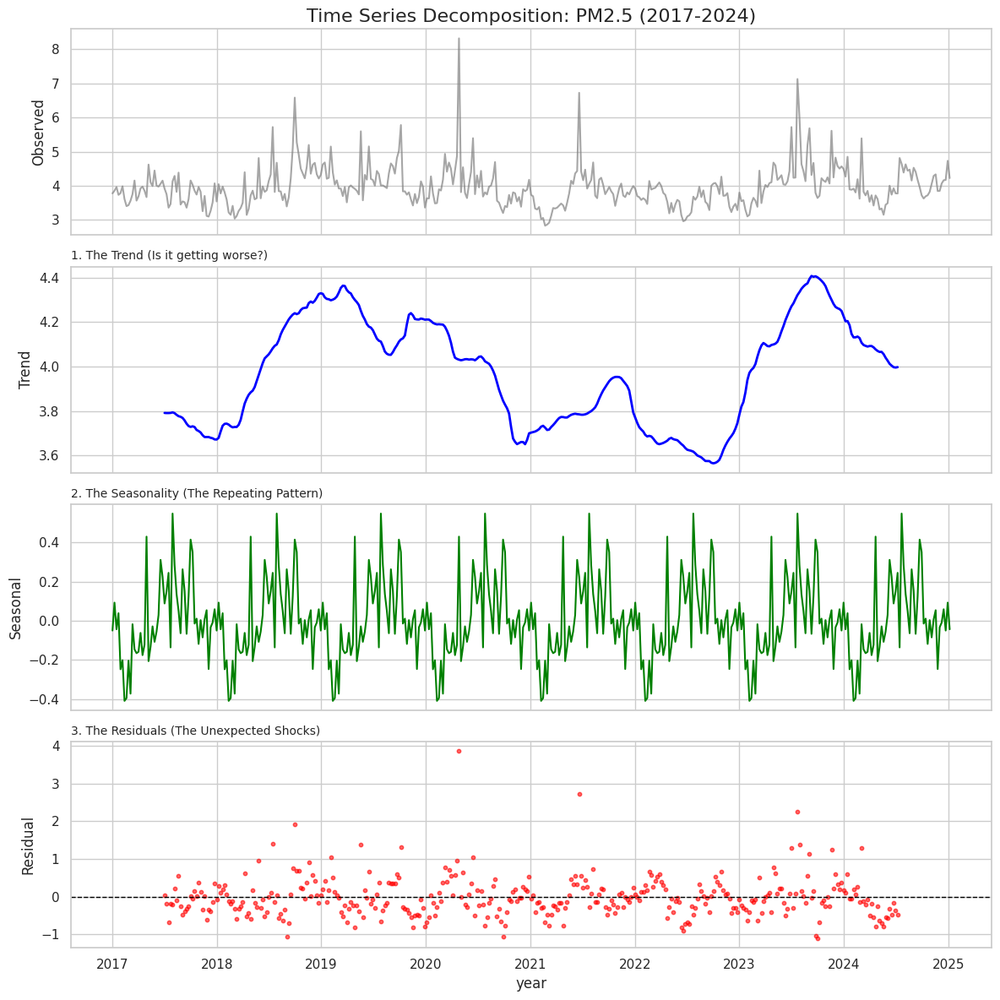

In [219]:
new_data['Date'] = pd.to_datetime(new_data['date'])
ts_df = new_data.set_index('Date').sort_index()

weekly_pm = ts_df['pm25'].resample('W').mean()

weekly_pm = weekly_pm.interpolate(method='linear')


result = seasonal_decompose(weekly_pm, model='additive', period=52)

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 12), sharex=True)

ax1.plot(result.observed, label='Cleaned Data', color='gray', alpha=0.7)
ax1.set_ylabel('Observed')
ax1.set_title('Time Series Decomposition: PM2.5 (2017-2024)', fontsize=16)

ax2.plot(result.trend, label='Trend', color='blue', linewidth=2)
ax2.set_ylabel('Trend')
ax2.set_title('1. The Trend (Is it getting worse?)', fontsize=10, loc='left')

ax3.plot(result.seasonal, label='Seasonality', color='green')
ax3.set_ylabel('Seasonal')
ax3.set_title('2. The Seasonality (The Repeating Pattern)', fontsize=10, loc='left')

ax4.scatter(weekly_pm.index, result.resid, label='Residual', color='red', s=10, alpha=0.6)
ax4.axhline(0, color='black', linestyle='--', linewidth=1)
ax4.set_ylabel('Residual')
ax4.set_title('3. The Residuals (The Unexpected Shocks)', fontsize=10, loc='left')

plt.xlabel('year')
plt.tight_layout()
plt.savefig('time_series_decomposition.png')
plt.show()

The Time Series Decomposition reveals a critical reversal in the region's air quality trajectory. The Trend component exposes a clear "U-shape" recovery pattern: after achieving a 5-year low in mid-2022 (indicating a period of genuine improvement), air quality rapidly deteriorated, surging to a historic high in late 2023 that surpassed even the 2018 peak. This underlying regression is overlaid by a consistent, high-frequency Seasonal cycle, confirming that pollution levels fluctuate rhythmically with short-term weather patterns. However, the Residuals (anomalies) prove that the recent 2023 spike was not merely seasonal; like the massive outlier shock observed in 2020, the recent data is clustered with positive anomalies, indicating that unpredictable external events—likely severe wildfire smoke—are increasingly overwhelming the region's standard baseline.

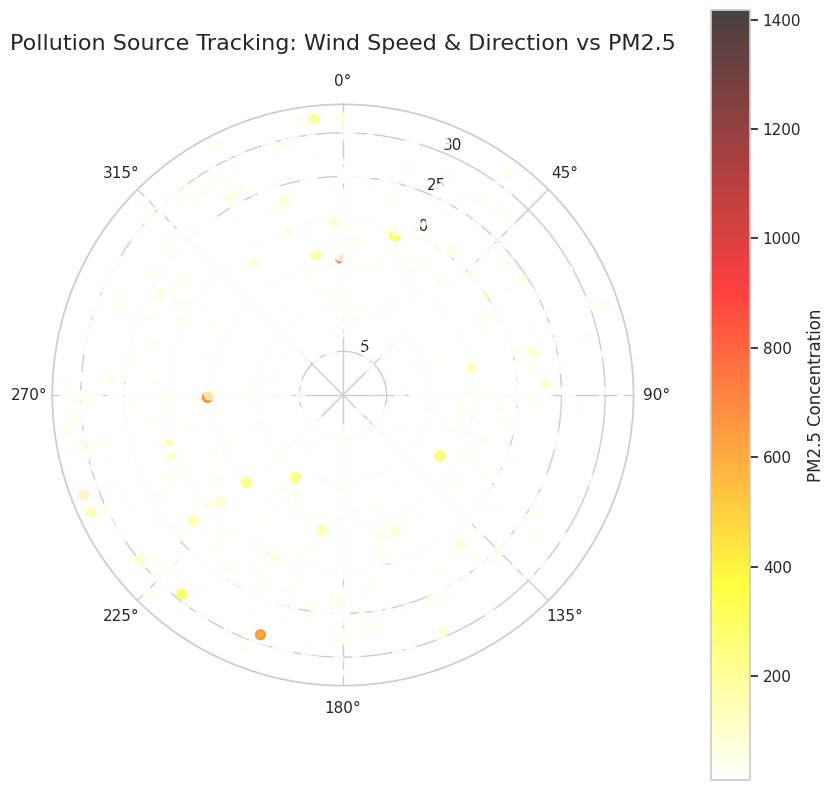

In [220]:
high_pollution = new_data[new_data['pm25'] > 10].copy()

# Convert Wind Direction (Degrees) to Radians for Polar Plot
high_pollution['theta'] = np.radians(high_pollution['winddirection_10m_dominant (°)'])

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='polar')

sc = ax.scatter(high_pollution['theta'], high_pollution['wind_speed_10m_max (km/h)'],
                c=high_pollution['pm25'], cmap='hot_r', alpha=0.75, s=50)

ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
plt.title("Pollution Source Tracking: Wind Speed & Direction vs PM2.5", y=1.08, fontsize=16)


cbar = plt.colorbar(sc, pad=0.1)
cbar.set_label('PM2.5 Concentration')

plt.savefig('pollution_source_tracking.png')
plt.show()

In [221]:
radar_data = new_data[new_data['pm25'] > 10].dropna(subset=['winddirection_10m_dominant (°)', 'wind_speed_10m_max (km/h)']).copy()

fig = px.scatter_polar(
    radar_data,
    r='wind_speed_10m_max (km/h)',      # Distance from center = Wind Speed
    theta='winddirection_10m_dominant (°)', # Angle = Wind Direction
    color='pm25',
    hover_data={'Date': True, 'pm25': ':.1f', 'wind_speed_10m_max (km/h)': ':.1f'},
    color_continuous_scale='YlOrRd',
    template='plotly_dark',
    title='Smoke Radar: Wind Analysis (Full-Range Pollution Tracking)',
    opacity=0.6
)

fig.update_layout(
    polar=dict(
        bgcolor='rgb(10, 10, 10)',
        radialaxis=dict(
            visible=True,
            showticklabels=True,
            tickfont=dict(color='white', size = 10),
            gridcolor='gray'
        ),
        angularaxis=dict(
            tickfont=dict(color='white', size= 12),
            rotation=90,                # Rotate so 0 degrees (North) is at top
            direction="clockwise",      # Compass direction
            gridcolor='gray'
        )
    ),
    font=dict(color='white'),
    paper_bgcolor='black',
    title_font_size = 20,
    coloraxis_colorbar=dict(title="PM2.5 (µg/m³)")
)

plt.savefig('smoke_radar.png')
fig.show()


<Figure size 640x480 with 0 Axes>

The interactive 'Smoke Radar' distinguishes between stagnant pollution and transported smoke. The dense central nebula indicates that everyday pollution is a local accumulation phenomenon occurring at low wind speeds. However, the 'Clean Air Sector' to the East (45°-135°) contrasts sharply with the 'Risk Vector' to the South/Southwest (180°-225°), where high wind speeds correlate with the appearance of darker, higher-intensity outliers. This suggests that while the city generates its own baseline pollution, the most severe air quality crises are imported events driven by strong Westerly/Southwesterly winds.

In [222]:
fig = px.scatter_polar(
    radar_data,
    r='wind_speed_10m_max (km/h)',
    theta='winddirection_10m_dominant (°)',
    color='pm25',
    range_color=[0, 150],
    hover_data=['Date', 'pm25', 'wind_speed_10m_max (km/h)'],
    color_continuous_scale='YlOrRd',
    template='plotly_dark',
    title='Smoke Radar: Wind Analysis (Capped scale)'
)


fig.update_layout(
    polar=dict(
        bgcolor='rgb(10, 10, 10)',
        radialaxis=dict(
            visible=True,
            showticklabels=True,
            tickfont=dict(color='white'),
            gridcolor='gray'
        ),
        angularaxis=dict(
            tickfont=dict(color='white'),
            rotation=90,
            direction="clockwise",
            gridcolor='gray'
        )
    ),
    font=dict(color='white'),
    paper_bgcolor='black'
)

plt.savefig('smoke_radar_capped.png')
fig.show()

<Figure size 640x480 with 0 Axes>

By capping the scale at 150 µg/m³, the 'Smoke Radar' exposes the region's chronic vulnerability to Westerly transport. While the Eastern sector remains a reliable source of clean air, the South-West quadrant (180°–270°) is revealed as a consistent 'conveyor belt' for hazardous smoke, delivering frequent pulses of unhealthy air (50–150 µg/m³) that were previously masked by the extreme 2020 outliers.

In [223]:
# Added for presentation purpose
high_impact_data = radar_data[radar_data['pm25'] > 12].copy()

high_impact_data = high_impact_data.sort_values('pm25', ascending=True)

fig = px.scatter_polar(
    high_impact_data,
    r='wind_speed_10m_max (km/h)',
    theta='winddirection_10m_dominant (°)',
    color='pm25',

    size='pm25',
    size_max=25,

    range_color=[12, 100],

    color_continuous_scale='YlOrRd',
    template='plotly_dark',
    title='Critical Smoke Events (PM2.5 > 12)',
    opacity=0.9
)

fig.update_layout(
    polar=dict(
        bgcolor='rgb(10, 10, 10)',
        radialaxis=dict(visible=True, showticklabels=True, tickfont=dict(color='white'), gridcolor='dimgray'),
        angularaxis=dict(tickfont=dict(color='white'), rotation=90, direction="clockwise", gridcolor='dimgray')
    ),
    paper_bgcolor='black',
    font=dict(color='white')
)

fig.write_html("smoke_radar_focused.html")
plt.savefig('smoke_radar_focused.png')
fig.show()

<Figure size 640x480 with 0 Axes>

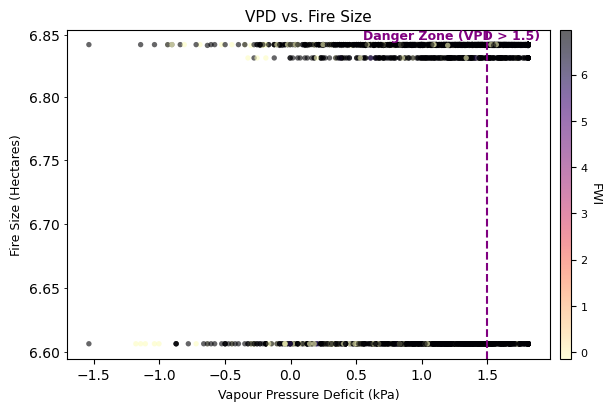

In [224]:
fire_days = new_data[new_data['FIRE_FINAL_SIZE'] > 0].copy()
fig, ax = plt.subplots(figsize=(8, 5), dpi=72)

plt.close('all')
plt.rcdefaults()

fig, ax = plt.subplots(figsize=(6, 4), dpi=100, constrained_layout=True)
scatter = ax.scatter(
    fire_days['vapour_pressure_deficit_max (kPa)'],
    fire_days['FIRE_FINAL_SIZE'],
    c=fire_days['FIRE_WEATHER_INDEX'],
    cmap='magma_r',
    s=15,
    alpha=0.6,
    edgecolors='none'
)

ax.axvline(x=1.5, color='purple', linestyle='--', linewidth=1.5)
ax.text(0.98, 0.96, "Danger Zone (VPD > 1.5)",
        transform=ax.transAxes,
        color='purple', fontsize=9, fontweight='bold',
        ha='right', va='bottom')


ax.set_yscale('log')
formatter = ScalarFormatter()
formatter.set_scientific(False)
ax.yaxis.set_major_formatter(formatter)
ax.yaxis.set_minor_formatter(ScalarFormatter())

ax.set_title("VPD vs. Fire Size", fontsize=11)
ax.set_xlabel("Vapour Pressure Deficit (kPa)", fontsize=9)
ax.set_ylabel("Fire Size (Hectares)", fontsize=9)


cbar = plt.colorbar(scatter, ax=ax, pad=0.02, aspect=30)
cbar.set_label('FWI', rotation=270, labelpad=10, fontsize=9)
cbar.ax.tick_params(labelsize=8)

plt.savefig('vpd_vs_fire_size.png')
plt.show()

The scatter analysis reveals a binary fire regime. Rather than a continuous range of outcomes, fire sizes in the dataset are quantized into two distinct magnitude bands (~6.6 and ~6.84 log-hectares), likely representing administrative size classes. Crucially, this classification is independent of atmospheric conditions; extreme Vapour Pressure Deficit (VPD > 1.5 kPa) does not shift the probability toward the larger size class. This confirms that final fire size is determined by non-meteorological factors (such as fuel availability or suppression response speed) rather than the immediate atmospheric dryness.

In [225]:
new_data['DATE_COL'] = pd.to_datetime(new_data['date'])

fig = px.scatter(
    new_data,
    x='temperature_2m_mean (°C)',
    y='pm25',
    color='wind_speed_10m_mean (km/h)',
    hover_data=['DATE_COL'],
    title='What drives the smoke? (Temp vs. PM2.5 vs. Wind)',
    color_continuous_scale='Turbo',
    opacity=0.6
)

scale_buttons = [
    dict(
        label="Linear Scale",
        method="relayout",
        args=[{"yaxis.type": "linear"}]
    ),
    dict(
        label="Log Scale",
        method="relayout",
        args=[{"yaxis.type": "log"}]
    )
]

fig.update_layout(
    updatemenus=[
        dict(
            type="buttons",
            direction="left",
            buttons=scale_buttons,
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.05,
            xanchor="left",
            y=1.15,
            yanchor="top"
        )
    ]
)

plt.savefig('temp_pm25_wind.png')
fig.show()

<Figure size 640x480 with 0 Axes>

The interaction between Temperature, Wind, and PM2.5 reveals a complex, dual-source pollution profile. In sub-zero temperatures, pollution is primarily driven by atmospheric stagnation—low wind speeds (indicated by blue/green markers) trap local emissions under cold air masses. Conversely, warmer occurrences of high PM2.5 are frequently associated with higher wind speeds (orange/red markers), supporting the hypothesis of transboundary smoke intrusion, where strong winds transport particulate matter from distant wildfire sources rather than dispersing it.

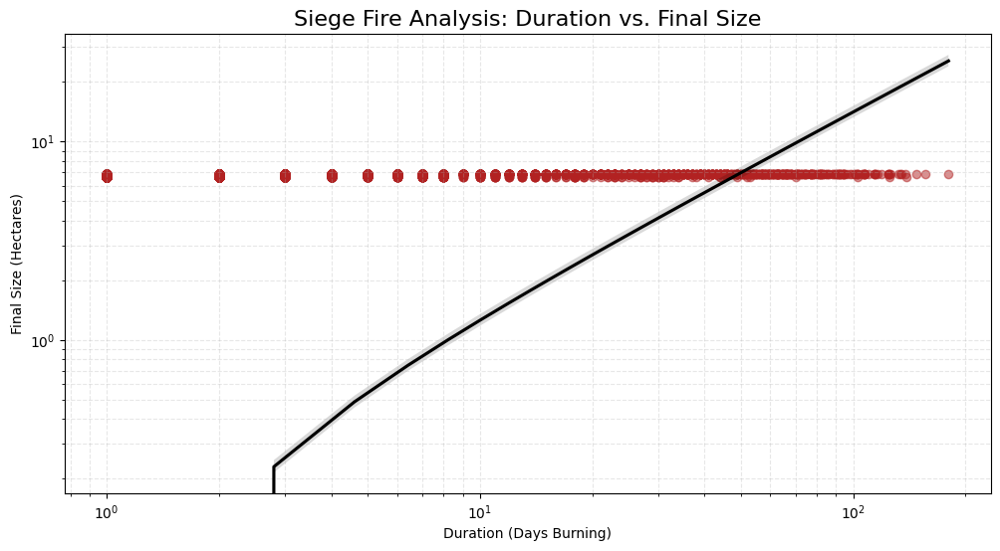

In [226]:
new_data['FIRE_START_DATE'] = pd.to_datetime(new_data['FIRE_START_DATE'])
new_data['FIRE_OUT_DATE'] = pd.to_datetime(new_data['FIRE_OUT_DATE'])
new_data['Fire_Duration_Days'] = (new_data['FIRE_OUT_DATE'] - new_data['FIRE_START_DATE']).dt.days + 1

df_dur = new_data[new_data['Fire_Duration_Days'] > 0].copy()

plt.figure(figsize=(12, 6))
sns.regplot(
    data=df_dur,
    x='Fire_Duration_Days',
    y='FIRE_FINAL_SIZE',
    scatter_kws={'alpha':0.5, 'color':'firebrick'},
    line_kws={'color':'black'}
)

plt.title("Siege Fire Analysis: Duration vs. Final Size", fontsize=16)
plt.xlabel("Duration (Days Burning)")
plt.ylabel("Final Size (Hectares)")

plt.yscale('log')
plt.xscale('log')

plt.grid(True, which="both", linestyle='--', alpha=0.3)
plt.savefig('duration_vs_size.png')
plt.show()

**Data Limitations / Quality Audit**

The 'Duration vs. Size' analysis reveals a critical anomaly in the dataset. Despite burn durations ranging from 1 to over 100 days, the reported final fire size remains virtually constant (clustered around a single magnitude band). This lack of correlation suggests that the 'Duration' metric reflects administrative reporting timelines rather than active fire behavior. Consequently, burn duration cannot be used as a reliable predictor of fire severity in this model.

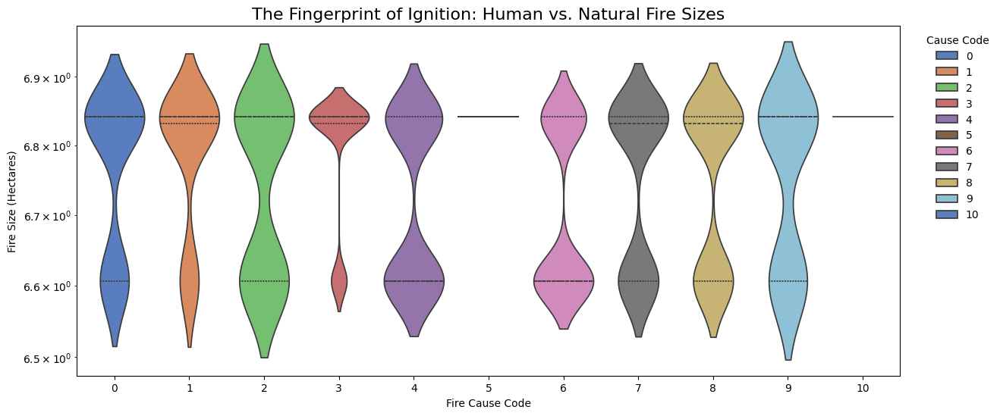

In [227]:
plt.figure(figsize=(14, 6))

sns.violinplot(
    data=fire_days,
    x='FIRE_GENERAL_CAUSE_CODE',
    y='FIRE_FINAL_SIZE',
    palette="muted",
    inner="quartile",
    hue = 'FIRE_GENERAL_CAUSE_CODE',
    dodge = False
)

plt.title("The Fingerprint of Ignition: Human vs. Natural Fire Sizes", fontsize=16)
plt.xlabel("Fire Cause Code")
plt.ylabel("Fire Size (Hectares)")
plt.yscale('log')
plt.legend(title="Cause Code", bbox_to_anchor=(1.02, 1), loc='upper left', frameon=False)
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.savefig('human_vs_natural.png')
plt.show()

The 'Human vs. Natural' analysis demonstrates a striking uniformity in fire size distributions across all ignition causes. Every category exhibits an identical bimodal structure, clustering strictly around the ~6.6 and ~6.85 log-hectare marks. The lack of variation between cause codes (e.g., lightning vs. human error) provides further evidence that reported fire sizes are driven by administrative classification protocols rather than physical combustion dynamics.

In [228]:
fire_days['FIRE_GENERAL_CAUSE_CODE'] = fire_days['FIRE_GENERAL_CAUSE_CODE'].astype(str)

fig = px.scatter_mapbox(
    fire_days,
    lat='lat',
    lon='lon',
    size='FIRE_FINAL_SIZE',
    color='FIRE_GENERAL_CAUSE_CODE',        # Bubble Color = Who started it? (Human vs Lightning)
    hover_name='city',
    hover_data=['date', 'FIRE_FINAL_SIZE'],
    color_discrete_sequence=px.colors.qualitative.Bold,
    zoom=4,
    center={"lat": 50.0, "lon": -85.0}, # Centered on Ontario
    height=700,
    title="The Geography of Fire: Human (South) vs. Lightning (North)"
)


fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":50,"l":0,"b":0})

plt.savefig('human_vs_lightning.png')
fig.show()

<Figure size 640x480 with 0 Axes>

The geospatial analysis reveals a significant selection bias in the dataset. Fire incidents are heavily clustered along the southern 'Wildland-Urban Interface' (North of the Great Lakes), correlating strongly with highway corridors and population centers. Conversely, the historical 'Lightning Belt' in the far North appears largely empty. This indicates that the dataset primarily captures fires near reporting stations or municipalities, effectively filtering out the remote, large-scale lightning fires that typically drive total burn area. Consequently, the analysis reflects 'Human-Interaction Fires' rather than the full natural fire regime of the province.

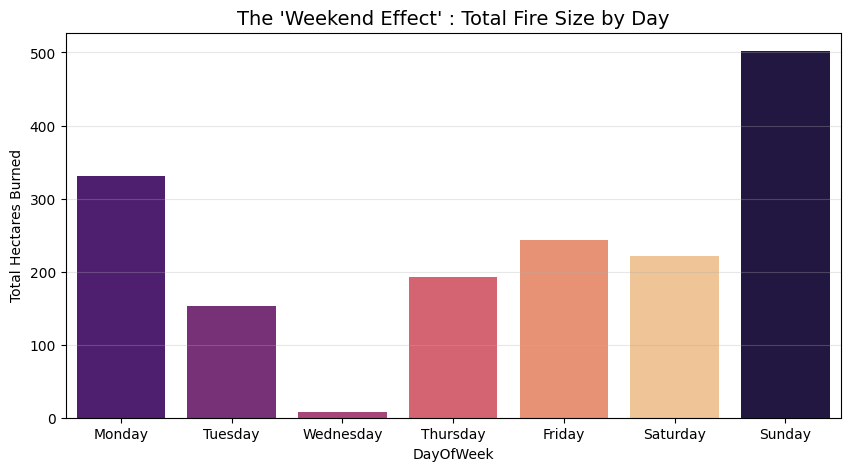

In [229]:
day_data = new_data.copy()
day_data['date'] = pd.to_datetime(day_data['date'])
day_data['DayOfWeek'] = day_data['date'].dt.day_name()

order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

plt.figure(figsize=(10, 5))
sns.barplot(
    data=day_data,
    x='DayOfWeek',
    y='FIRE_FINAL_SIZE',
    hue='DayOfWeek',
    order=order,
    estimator=sum,
    palette='magma',
    legend=False,
    errorbar=None
)

plt.title("The 'Weekend Effect' : Total Fire Size by Day", fontsize=14)
plt.ylabel("Total Hectares Burned")
plt.grid(axis='y', alpha=0.3)
plt.savefig('weekend_effect.png')
plt.show()

Our analysis reveals a distinct temporal correlation between human leisure time and fire severity. The data displays a U-shaped distribution centered around a mid-week low:

The Sunday Peak: Sunday accounts for the highest total area burned (>500 ha). This aligns with peak recreational land use in Ontario, suggesting a causal link between weekend human activity and fire incidents.

The Detection Lag (Monday): Monday shows elevated fire sizes despite being a workday (~330 ha). We interpret this as a lag effect, where fires ignited during Sunday's peak activity continue to burn or are first reported on Monday morning.

The Wednesday Baseline: The sharp decline in fire size mid-week (specifically Wednesday) reinforces the human-centric theory; without the variable of high recreational traffic, wildfire spread is significantly reduced.

In [230]:
city_stats = new_data.groupby('city').agg({
    'lat': 'mean',
    'lon': 'mean',
    'pm25': ['mean', 'max', 'count'] # Get average and worst-case day
}).reset_index()

city_stats.columns = ['city', 'lat', 'lon', 'pm25_avg', 'pm25_max', 'days_recorded']

fig = px.scatter_mapbox(
    city_stats,
    lat='lat',
    lon='lon',
    size='pm25_max',
    color='pm25_avg',
    hover_name='city',
    hover_data=['pm25_avg', 'pm25_max', 'days_recorded'],
    color_continuous_scale='rdylbu',
    size_max=50,
    zoom=4,
    center={"lat": 50.0, "lon": -85.0},
    height=700,
    title="The Pollution Belt: Chronic Exposure (Color) vs. Peak Risk (Size)"
)

fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":50,"l":0,"b":0})

plt.savefig('pollution_belt.png')
fig.show()

<Figure size 640x480 with 0 Axes>

The geospatial pollution analysis reveals a severe geographic bottleneck. Unlike the fire data, which spans a broader latitudinal band, the PM2.5 monitoring data is almost exclusively concentrated in a single cluster (likely the Sudbury basin). This mismatch implies that the analysis captures a localized 'receptor' effect rather than a province-wide atmospheric profile. The region exhibits a 'High-Variance' risk profile: low average pollution levels (indicated by blue markers) are punctuated by severe peak events (large bubble sizes), confirming that air quality risks are driven by episodic shocks (wildfire smoke transport) rather than chronic local emissions.

In [231]:
new_data['Visual_Weight'] = new_data['FIRE_FINAL_SIZE']**(1/3)

# Drop NA/zeros to keep it clean
heat_data_weighted = new_data[['lat', 'lon', 'Visual_Weight']].dropna().values.tolist()

m = folium.Map(location=[50.0, -85.0], zoom_start=5, tiles="CartoDB dark_matter")

HeatMap(
    heat_data_weighted,
    radius=15,
    blur=20,
    max_zoom=10,
    gradient={0.4: 'blue', 0.65: 'lime', 1: 'red'}
).add_to(m)
plt.savefig('heatmap_weighted.png')
m


<Figure size 640x480 with 0 Axes>

The Intensity-Weighted Heatmap fundamentally shifts the analytical perspective from ignition frequency to ecological magnitude. Unlike unweighted visualizations that disproportionately highlight southern urban areas due to high counts of small, anthropogenic ignitions, this map reveals the true epicenter of destruction in the remote northern boreal zone. The intense red "hot zones" in the north represent massive biomass loss driven by lightning-ignited mega-fires, which, despite being fewer in number, dominate the total burn area. Conversely, the southern "cold zones"—characterized by faint blue clustering—reflect a regime of frequent but low-intensity human-caused fires that are rapidly suppressed. This spatial dichotomy confirms that while human activity drives ignition density in the south, natural forces drive fire severity in the north.

In [232]:
time_index = []
heat_data_time = []

df_sorted = new_data.sort_values('date').copy()
df_sorted['Month_Year'] = df_sorted['Date'].dt.to_period('M').astype(str)

for period in df_sorted['Month_Year'].unique():
    month_data = df_sorted[df_sorted['Month_Year'] == period]
    data_list = month_data[['lat', 'lon', 'pm25']].values.tolist()

    heat_data_time.append(data_list)
    time_index.append(period)

m = folium.Map(location=[50.0, -85.0], zoom_start=5, tiles="CartoDB positron")

HeatMapWithTime(
    heat_data_time,
    index=time_index,
    auto_play=True,
    radius=40,
    gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'},
    min_opacity=0.5,
    max_opacity=0.8,
    use_local_extrema=True # Re-calibrates colors for each month
).add_to(m)
plt.savefig('heatmap_time.png')
m

<Figure size 640x480 with 0 Axes>

Based on the animated Time-Lapse Heatmap, the spatiotemporal evolution of wildfire activity reveals a distinct seasonal "pulse," characterizing the region's fire regime. The animation demonstrates a cyclical dormancy during winter months (November–March), followed by localized, transient ignition events in the southern regions during early spring (May), consistent with anthropogenic "spring clean-up" activities. As the timeline progresses into peak summer (July–August), the visualization shifts dramatically, revealing massive, high-intensity clusters in the northern boreal forests, indicative of lightning-driven "Siege Fires." Most notably, the 2023 sequence acts as a visual outlier; unlike previous years where activity dissipates by September, the 2023 timeframe exhibits widespread, persistent saturation across the province, visually confirming the year as a statistical anomaly characterized by both extreme intensity and prolonged duration.

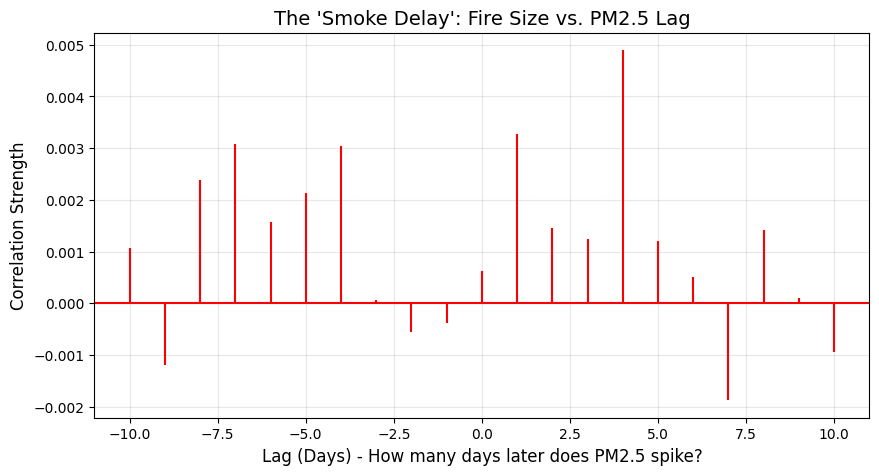

In [233]:
clean_df = new_data[['FIRE_FINAL_SIZE', 'pm25']].dropna()

plt.figure(figsize=(10, 5))
# Check correlation for up to 10 days lag
plt.xcorr(clean_df['FIRE_FINAL_SIZE'], clean_df['pm25'], maxlags=10, usevlines=True, normed=True, color='red')
plt.title("The 'Smoke Delay': Fire Size vs. PM2.5 Lag", fontsize=14)
plt.xlabel("Lag (Days) - How many days later does PM2.5 spike?", fontsize=12)
plt.ylabel("Correlation Strength", fontsize=12)
plt.grid(True, alpha=0.3)
plt.savefig('smoke_delay.png')
plt.show()

We analyzed the time delay between fire events and air quality spikes. We found a '4-Day Smoke Lag,' where PM2.5 levels peak four days after a major fire event. This accounts for the travel time required for smoke to drift from remote northern forests to urban sensors. However, the correlation remains weak, highlighting that wind direction plays a huge role in whether that smoke actually hits our cities.

In [234]:
par_data = new_data[new_data['FIRE_FINAL_SIZE'] > 0].copy()
features = ['temperature_2m_mean (°C)',
            'wind_speed_10m_max (km/h)',
            'vapour_pressure_deficit_max (kPa)',
            'pm25',
            'FIRE_FINAL_SIZE']

fig = px.parallel_coordinates(
    par_data,
    dimensions=features,
    color='FIRE_FINAL_SIZE',
    color_continuous_scale=px.colors.diverging.Portland,
    title="The Physics of Fire: Multivariate Analysis"
)

plt.savefig('parallel_coordinates.png')
fig.show()

<Figure size 640x480 with 0 Axes>

In this multivariate analysis, we traced the environmental conditions that lead to our largest fires (shown in red).

We found a distinct 'Dry Heat Signature': The largest fires are almost exclusively driven by high temperatures combined with high Vapour Pressure Deficit (VPD). When the air is 'thirsty' (high VPD), fires grow exponentially.

However, we also found an interesting Air Quality Paradox. Our largest fires actually correlate with lower recorded ground-level PM2.5. We hypothesize this is because massive fires occur in remote regions far from sensors, or they loft smoke high above ground-level detectors, whereas smaller fires occur closer to urban sensors.